In [51]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping

from matplotlib import cm, colors
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

import paperstyle as ps

nn_style = {
        'axes.labelsize': 12,
            'axes.linewidth' : 1.5,
            'font.size': 12,
            'font.family': 'Times New Roman',
            'mathtext.fontset': 'stix',
            'legend.fontsize': 12,
            'xtick.labelsize': 12,
            'ytick.labelsize': 12,
            'text.usetex': False, 
            'lines.linewidth': 1,
            'lines.linestyle': ' ',
            'lines.markersize' : 6,
            'lines.markeredgewidth' : 1,
            'xtick.major.size' : 5,
            'xtick.minor.size' : 0,
            'xtick.major.width' : 2,
            'xtick.minor.width' : 0,
            'xtick.direction' : 'in',
            'ytick.major.size' : 5,
            'ytick.minor.size' : 0,
            'ytick.major.width' : 2,
            'ytick.minor.width' : 0,
            'ytick.direction' : 'in',
            'xtick.minor.visible' : True,
            'ytick.minor.visible' : True,
            'savefig.transparent': True,
            'errorbar.capsize': 1.5,
            }

def PlotModel(model, pdf, features, cutoff, filename):
    
    params = {'axes.labelsize': 18,
            'axes.linewidth' : 1.5,
            'font.size': 18,
            'font.family': 'Times New Roman',
            'mathtext.fontset': 'stix',
            'legend.fontsize': 20,
            'xtick.labelsize': 18,
            'ytick.labelsize': 20,
            'text.usetex': False,
            'lines.linewidth': 1,
            'lines.linestyle': ' ',
            'lines.markersize' : 6,
            'lines.markeredgewidth' : 1,
            'xtick.major.size' : 5,
            'xtick.minor.size' : 3,
            'xtick.major.width' : 2,
            'xtick.minor.width' : 1,
            'xtick.direction' : 'in',
            'ytick.major.size' : 5,
            'ytick.minor.size' : 3,
            'ytick.major.width' : 2,
            'ytick.minor.width' : 1,
            'ytick.direction' : 'in',
            'xtick.minor.visible' : True,
            'ytick.minor.visible' : True,
            'figure.figsize': (8,6),
            'savefig.transparent': True,
            'errorbar.capsize': 1.5,
            }
    plt.rcParams.update(params)
    
    
    num_layers = len(model.layers)
    print('Number of layers: ', num_layers)
    layers = []
    for i in range(num_layers):
            layers.append(model.get_layer(index=i))

    layerX = {}
    layerY = {}
    layerOutput = {}
    layerProbability = {}
    layerWeights = {}
    layerBias = {}
    layerNactive = {}

    ymin = 1
    ymax = 2000
    nsamples = pdf.shape[0]
    X = pdf[features].values
    InputX = np.ones(X.shape[1])
    InputY = np.linspace(ymin,ymax,X.shape[1])
    InputProbability = np.ones(X.shape[1])
    for i in range(num_layers):
            layerWeights[i] = layers[i].get_weights()[0]
            layerBias[i] = layers[i].get_weights()[1]
            layerX[i] = np.ones(layerWeights[i].shape[1])*(i+2)
            if i == num_layers-1:
                    layerY[i] = np.array([(ymax-ymin)/2])
            else:
                    layerY[i] = np.linspace(ymin,ymax,layerWeights[i].shape[1])
            if i == 0:
                    layerOutput[i] = layers[i](X)
            else:
                    layerOutput[i] = layers[i](layerOutput[i-1])
                    
            layerProbability[i] = np.sum(layerOutput[i]>cutoff, axis=0)/nsamples
            layerNactive[i] = np.count_nonzero(layerProbability[i])

    fig = plt.figure(figsize=(15,20))
    ax = fig.add_subplot(111)        

    for ilayer in range(num_layers):
            for i in range(layerWeights[ilayer].shape[0]):
                    for j in range(layerWeights[ilayer].shape[1]):
                                    if ilayer == 0:
                                            if layerProbability[ilayer][j] > cutoff:
                                                    ax.plot([InputX[i]+0.02, layerX[ilayer][j]-0.02], [InputY[i], layerY[ilayer][j]], linewidth=0.5,
                                                            c=cm.Blues(np.abs(layerWeights[ilayer][i,j])/np.max(np.abs(layerWeights[ilayer][:,j]))), linestyle='-', alpha=0.7)
                                    else:
                                            if layerProbability[ilayer][j] > cutoff:
                                                    ax.plot([layerX[ilayer-1][i]+0.02, layerX[ilayer][j]-0.02], [layerY[ilayer-1][i], layerY[ilayer][j]], linewidth=0.5,
                                                            c=cm.Blues(np.abs(layerWeights[ilayer][i,j])/np.max(np.abs(layerWeights[ilayer][:,j]))), linestyle='-', alpha=0.7)
                                    
    ax.scatter(InputX, InputY, s=30, c=InputProbability, cmap='Reds', alpha=1.0, vmin=0, vmax=1)
    for i in range(num_layers):
            ax.scatter(layerX[i][layerProbability[i] > cutoff], layerY[i][layerProbability[i] > cutoff], s=30, c=layerProbability[i][layerProbability[i]>cutoff], cmap='Reds', alpha=1.0, vmin=0, vmax=1)
            
    ax.set_xlim(0.8, num_layers+1.2)
    xticks = [i+1 for i in range(num_layers+1)]
    ax.set_xticks(xticks)
    ax.set_xticklabels(['Input']+['Layer '+str(i+1) for i in range(0,num_layers-1)]+['Output'])
    ax.set_ylim(ymin-200,ymax+200)
    ax.set_yticks(InputY)
    top_features_tex = [r'$\lambda_{\beta=1}$', r'$A_{\mathrm{jet}}$', r'$p_{\mathrm{T,raw}}$', r'$N_{\mathrm{track}}$', r'$p_{\mathrm{T,track}}^{0}$']
    ax.set_yticklabels(top_features_tex)
    ax.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Reds'), ax=ax, location='top', pad=0.1, aspect=50, anchor=(0.5,-0.7))
    ax.cbar.set_label('Probability of Neuron Activation', rotation=0, labelpad=10)
    ax2 = ax.twinx()
    ax2.set_ylim(ax.get_ylim()[0],ax.get_ylim()[1])
    ax2.set_yticks(layerY[num_layers-1])
    ax2.set_yticklabels([r'$p_{\mathrm{T,truth}}$'])
    ax2.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Blues'), ax=ax2, location='bottom', pad=0.1, aspect=50, anchor=(0.5,1.5))
    ax2.cbar.set_label('Normalized Weights', rotation=0, labelpad=10)
    plt.show()
    
    active_nodes = []
    for i in range(num_layers):
            active_nodes.append(layerNactive[i])
    fig.savefig(f'plots/{filename}.pdf', bbox_inches='tight')
    return active_nodes

def GetPlot(model_results, features):
        ymin = 1
        ymax = 20000
        layerX = [np.ones(len(features))]
        layerY = [np.linspace(ymin,ymax,len(features))]
        layer_probabilities = [np.ones(len(features))]
        layer_weights = []
        for i in range(len(model_results['activation_prob'])):
                layer_probabilities.append(model_results['activation_prob'][i])
                layer_weights.append(model_results['weights'][i])
                layerX.append(np.ones(len(model_results['activation_prob'][i]))*(i+2))
                if i == len(model_results['activation_prob'])-1:
                        layerY.append(np.array([(ymax-ymin)/2]))
                else:
                        layerY.append(np.linspace(ymin,ymax,len(model_results['activation_prob'][i])))

        line_iXY = []
        line_fXY = []
        line_W = []
        node_XY = []
        node_W = []

        cutoff = 0.0
        for iW, w in enumerate(layer_weights):
                for iY, iprob in enumerate(layer_probabilities[iW]):
                        if iprob > cutoff:
                                node_XY.append([layerX[iW][iY],layerY[iW][iY]])
                                node_W.append(layer_probabilities[iW][iY])
                                for jY, jprob in enumerate(layer_probabilities[iW+1]):
                                        if jprob > cutoff:
                                                node_XY.append([layerX[iW+1][jY],layerY[iW+1][jY]])
                                                node_W.append(layer_probabilities[iW+1][jY])
                                                line_iXY.append([layerX[iW][iY],layerY[iW][iY]])
                                                line_fXY.append([layerX[iW+1][jY],layerY[iW+1][jY]])
                                                line_W.append(np.abs(w[iY,jY]/np.max(np.abs(w[:,jY]))))    
        line_iXY = np.array(line_iXY)
        line_fXY = np.array(line_fXY)
        line_W = np.array(line_W)
        node_XY = np.array(node_XY)
        node_W = np.array(node_W)
        fig = plt.figure(figsize=(12,6))
        ax = fig.add_subplot(111)   
        for A, B, W in zip(line_iXY, line_fXY, line_W):
                ax.plot([A[0]+0.03, B[0]-0.03], [A[1], B[1]], c=cm.Blues(W), linewidth=0.5, alpha=0.5, linestyle='-', marker=' ', markersize=0)
        ax.scatter(node_XY[:,0],node_XY[:,1],c=node_W,cmap=cm.Reds,s=30,alpha=1.0)
        # plt.show()
        
        Plot = {}
        Plot['iXY'] = line_iXY
        Plot['fXY'] = line_fXY
        Plot['lineW'] = line_W
        Plot['nodeXY'] = node_XY
        Plot['nodeW'] = node_W
        
        return Plot

def PruneModel(model,pdf_file, features, target):
        # probability cutoff
        pdf =  pd.read_hdf(pdf_file, key='df').sample(frac=0.5).copy()
        cutoff = 0.0
        model.summary()
        model.compile(loss='mse', optimizer='adam', metrics=['mse'])
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
        model.fit(pdf[features].values, pdf[target].values, epochs=100, batch_size=128, verbose=0, validation_split=0.2, callbacks=[es])
        layer_in_model = []
        for i in range(len(model.layers)):
                layer_in_model.append(model.get_layer(index=i))

        X = pdf[features].values 
        layer_activation_probabilities = {}
        layer_weights = {}
        layer_biases = {}
        weights_for_plot = []
        for i in range(len(layer_in_model)):
                
                layer_outputs = layer_in_model[i](X)
                layer_activation_probabilities[i] = np.count_nonzero(np.array(layer_outputs), axis=0)/X.shape[0]
                layer_weights[i] = layer_in_model[i].get_weights()[0]
                layer_biases[i] = layer_in_model[i].get_weights()[1]
                weights_for_plot.append(layer_weights[i])
                for j in range(layer_activation_probabilities[i].shape[0]):
                        if layer_activation_probabilities[i][j] <= cutoff:
                                        layer_weights[i][:,j] = 0.0
                                        layer_biases[i][j] = 0.0
                X = layer_in_model[i](X)   
                
        for i in range(1,len(layer_in_model)):
                for j in range(layer_activation_probabilities[i-1].shape[0]):
                        if layer_activation_probabilities[i-1][j] <= cutoff:
                                        layer_weights[i][j,:] = 0.0                               

        new_weights = {}
        new_biases = {}
        for i in range(1,len(layer_in_model)):
                weights = []
                bias = []
                for j in range(layer_weights[i].shape[0]):
                        w = layer_weights[i][j,:]
                        w = w[w != 0.0]
                        if w.size != 0:
                                weights.append(w)
                for j in range(layer_biases[i].shape[0]):
                        b = layer_biases[i][j]
                        if b != 0.0:
                                bias.append(b)
                                
                new_weights[i] = np.array(weights)
                new_biases[i] = np.array(bias)
                
        active_nodes = []
        for i in range(len(layer_in_model)):
                if np.count_nonzero(layer_activation_probabilities[i])  == 0:
                        active_nodes.append(1)
                else: 
                        active_nodes.append(np.count_nonzero(layer_activation_probabilities[i]))

        weights_for_new_model = []
        bias_for_new_model = []
        for w in new_weights:
                weights_for_new_model.append(new_weights[w])
                bias_for_new_model.append(new_biases[w])

        weights_for_plot = []
        for w in layer_weights:
                weights_for_plot.append(layer_weights[w])

        nodes_for_new_model = active_nodes 
        layer_activation_probabilities_for_plot = []
        for i in range(len(layer_in_model)):
                layer_activation_probabilities_for_plot.append(layer_activation_probabilities[i])
                
        mse_of_model = model.evaluate(pdf[features], pdf[target], verbose=0)[1]
        print('MSE of model: ', mse_of_model)   

        reduced_sum = 0
        for i in range(1,len(layer_in_model)):
                w2 = tf.reduce_sum(tf.square(layer_weights[i]))
                reduced_sum += w2.numpy()
        print('Reduced sum of W^2: ', reduced_sum)


        model_results = {}
        model_results['mse'] = mse_of_model
        model_results['activation_prob'] = layer_activation_probabilities_for_plot
        model_results['weights'] = weights_for_plot
        model_results['reduced_sum'] = reduced_sum
        
        new_model = {}
        new_model['weights'] = weights_for_new_model
        new_model['bias'] = bias_for_new_model
        new_model['nodes'] = nodes_for_new_model
        
        return model_results, new_model

def GetDNNPlot(kernel_reg = False, lam=0.0):
                
        filename = "/lustre/isaac/scratch/tmengel/jet-background-subtraction/datasets/root-files/AuAu_R04/test/AuAu_R04_50_test_sample.h5"
        dnn_features = ["jet_pt_raw","jet_nparts","jet_area","jet_angularity","jet_track_pt_0",
                                "jet_track_pt_1","jet_track_pt_2","jet_track_pt_3","jet_track_pt_4",
                                "jet_track_pt_5","jet_track_pt_6","jet_track_pt_7"]
        
        # dnn_features = ["jet_pt_raw","jet_nparts","jet_area","jet_angularity","jet_track_pt_0"]
        

        target='jet_pt_truth'
                        
        if kernel_reg:           
                model = keras.Sequential([
                tf.keras.layers.Dense(100,input_shape=(len(dnn_features),),activation='relu',kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(lam)),
                tf.keras.layers.Dense(100,activation='relu',kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(lam)),
                tf.keras.layers.Dense(50,activation='relu',kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(lam)),
                tf.keras.layers.Dense(1,activation='relu',kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(lam))
                ]
                )
        else:
                model = keras.Sequential([
                tf.keras.layers.Dense(100,input_shape=(len(dnn_features),),activation='relu',kernel_initializer='he_uniform'),
                tf.keras.layers.Dense(100,activation='relu',kernel_initializer='he_uniform'),
                tf.keras.layers.Dense(50,activation='relu',kernel_initializer='he_uniform'),
                tf.keras.layers.Dense(1,activation='relu',kernel_initializer='he_uniform')
                ])
                
                
        model_results, new_model = PruneModel(model,filename,features=dnn_features,target=target)
        PLOTS = GetPlot(model_results, dnn_features)
        trainable = 0
        new_nodes = new_model['nodes']
        print(new_nodes)
        new_nodes = np.array(new_nodes)
        trainable = np.sum(new_nodes)
        PLOTS['trainable'] = trainable
        PLOTS['new_nodes'] = new_nodes
        PLOTS['mse'] = model_results['mse']
        PLOTS['lam'] = lam
        PLOTS['reduced_sum'] = model_results['reduced_sum']
        
        return PLOTS

def GetNNPlot(architechture, lam=0.0):
        
        filename = "/lustre/isaac/scratch/tmengel/jet-background-subtraction/datasets/root-files/AuAu_R04/test/AuAu_R04_50_test_sample.h5"
        # dnn_features = ["jet_pt_raw","jet_nparts","jet_area","jet_angularity","jet_track_pt_0",
        #                         "jet_track_pt_1","jet_track_pt_2","jet_track_pt_3","jet_track_pt_4",
        #                         "jet_track_pt_5","jet_track_pt_6","jet_track_pt_7"]
        
        dnn_features = ["jet_pt_raw","jet_nparts","jet_area","jet_angularity","jet_track_pt_0"]

        target='jet_pt_truth'
        layers_list = []
        # input layer    
        layers_list.append(layers.Dense(architechture[0],input_shape=(len(dnn_features),),activation='relu',kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(lam)))
        # hidden layersl
        for i in range(1,len(architechture)-1):
                layers_list.append(layers.Dense(architechture[i],activation='relu',kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(lam)))
        # output layer
        layers_list.append(layers.Dense(architechture[-1],activation='relu',kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(lam)))

        model = keras.Sequential(layers_list)

        model_results, new_model = PruneModel(model,filename,features=dnn_features,target=target)
        PLOTS = GetPlot(model_results, dnn_features)
        trainable = 0
        new_nodes = new_model['nodes']
        # print(new_nodes)
        new_nodes = np.array(new_nodes)
        trainable = np.sum(new_nodes)
        PLOTS['trainable'] = trainable
        PLOTS['new_nodes'] = new_nodes
        PLOTS['mse'] = model_results['mse']
        PLOTS['lam'] = lam
        PLOTS['reduced_sum'] = model_results['reduced_sum']
        
        return PLOTS

def CombineLayersBelowNodeThreshold(node_list, threshold):
        # combine layers below a certain threshold to the previous layer
        new_node_list = []
        # loop in reverse order
        for i in range(len(node_list)-2,-1,-1):
                if node_list[i] < threshold:
                        node_list[i-1] = node_list[i-1] + node_list[i]
                        node_list[i] = 0
        for i in range(len(node_list)):
                if node_list[i] != 0:
                        new_node_list.append(node_list[i])
        return new_node_list

def MinimizeArchitecture(mse_threshold=0.05):
        NETWORKS = {}
        NETWORKS['initial'] = GetDNNPlot(kernel_reg=True, lam=0.01)
        
        original_mse = NETWORKS['initial']['mse']
        reduced_sum = NETWORKS['initial']['reduced_sum']
        new_nodes = NETWORKS['initial']['new_nodes']
        new_nodes_trimmed = CombineLayersBelowNodeThreshold(new_nodes, 3)

        mse = original_mse
        prunning_iteration = 0
        while True:
                percent_change = (mse - original_mse)/original_mse
                lam = (mse_threshold*original_mse)/reduced_sum
                new_nodes_trimmed = CombineLayersBelowNodeThreshold(new_nodes, 3)
                
                if len(new_nodes_trimmed) == 1:
                        print('Only one layer left')
                        break
                
                print(f'Prunning iteration: {prunning_iteration}')
                print(f'MSE: {mse}, Original MSE: {original_mse}, Percent Change: {percent_change*100}%')
               
                if percent_change > mse_threshold:
                        print('Percent change is greater than threshold')
                        break
                
                else:
                        print(f'Lambda: {lam}')
                        print(f'New Nodes: {new_nodes}')
                        print(f'New Nodes Trimmed: {new_nodes_trimmed}') 
                                               
                        TEMP_NETWORK = GetNNPlot(new_nodes_trimmed, lam)
                        mse_tmp = TEMP_NETWORK['mse']
                        if mse_tmp > 100: # error try again
                                continue
                        prunning_iteration += 1 
                        NETWORKS[f'iter_{prunning_iteration}'] = TEMP_NETWORK
                        mse = NETWORKS[f'iter_{prunning_iteration}']['mse']
                        new_nodes = NETWORKS[f'iter_{prunning_iteration}']['new_nodes']
                        reduced_sum = NETWORKS[f'iter_{prunning_iteration}']['reduced_sum']

        return NETWORKS

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_53 (Dense)            (None, 100)               600       
                                                                 
 dense_54 (Dense)            (None, 100)               10100     
                                                                 
 dense_55 (Dense)            (None, 50)                5050      
                                                                 
 dense_56 (Dense)            (None, 1)                 51        
                                                                 
Total params: 15,801
Trainable params: 15,801
Non-trainable params: 0
_________________________________________________________________
Epoch 63: early stopping
MSE of model:  3.5170493125915527
Reduced sum of W^2:  4.094995617866516
[22, 7, 7, 1]
Prunning iteration: 0
MSE: 3.5170493125915527, Original MSE: 3.517049

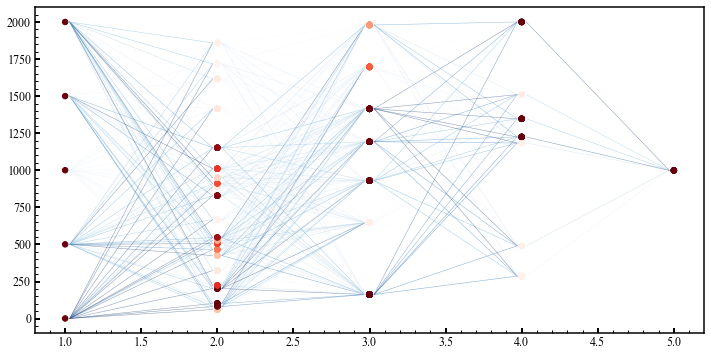

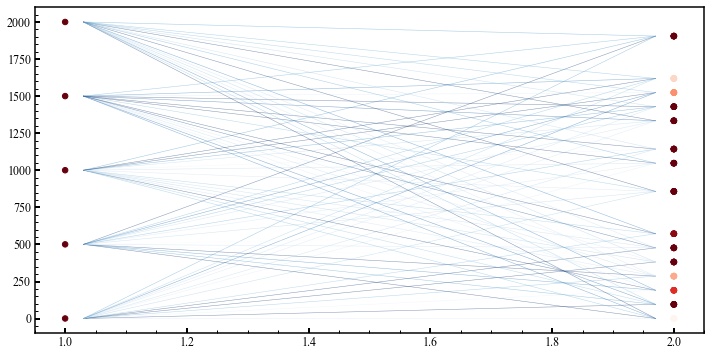

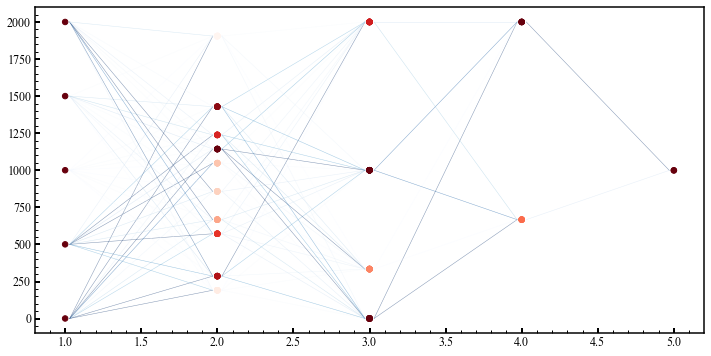

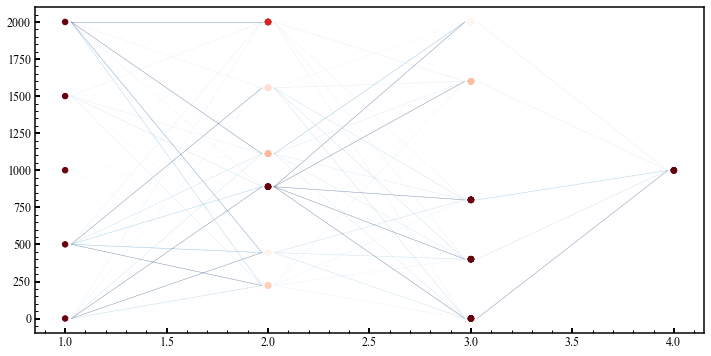

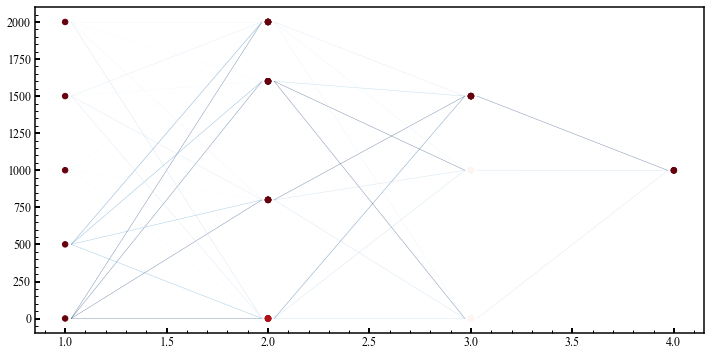

...

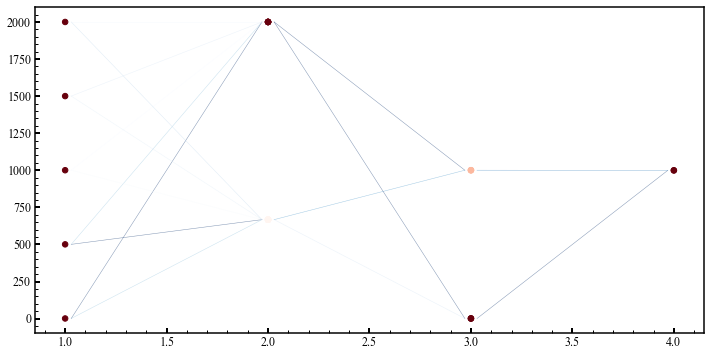

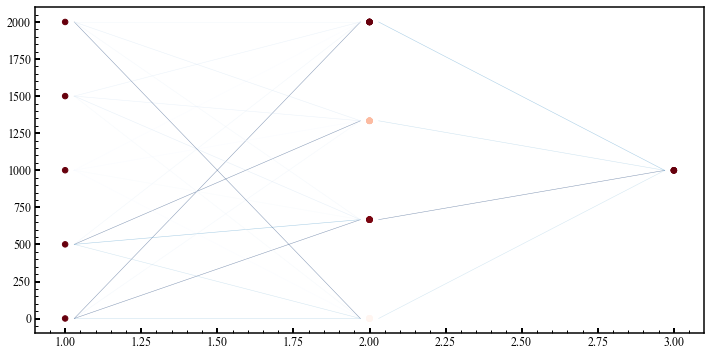

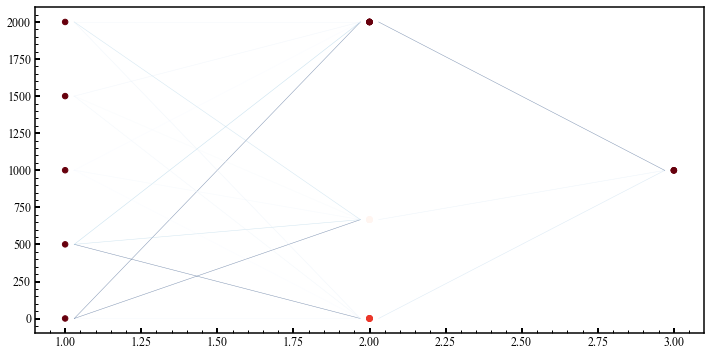

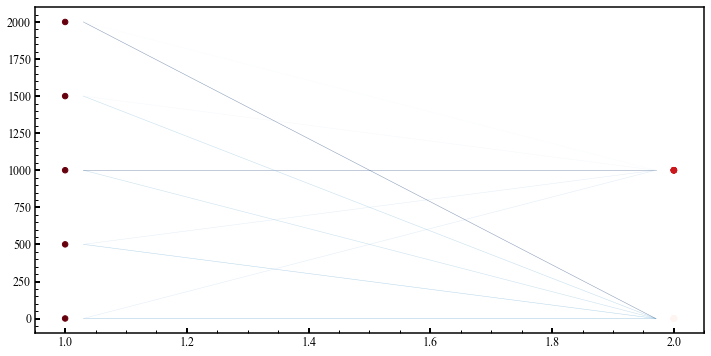

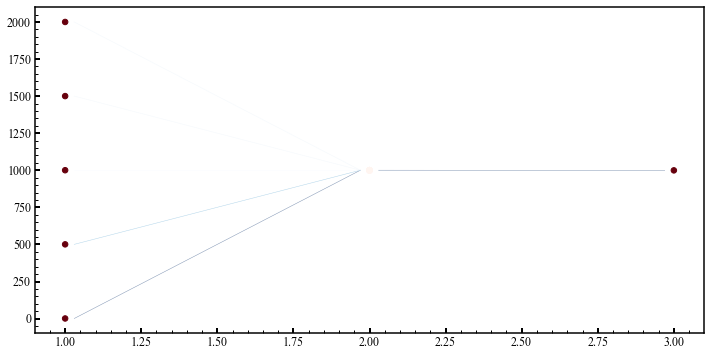

In [7]:
NN_PRUNED_DATA_100 = MinimizeArchitecture(mse_threshold=0.055)

In [18]:
NN_PRUNED_DATA_100['iter_2']

{'iXY': array([[1.00000000e+00, 1.00000000e+00],
        [1.00000000e+00, 1.00000000e+00],
        [1.00000000e+00, 1.00000000e+00],
        [1.00000000e+00, 1.00000000e+00],
        [1.00000000e+00, 1.00000000e+00],
        [1.00000000e+00, 1.00000000e+00],
        [1.00000000e+00, 5.00750000e+02],
        [1.00000000e+00, 5.00750000e+02],
        [1.00000000e+00, 5.00750000e+02],
        [1.00000000e+00, 5.00750000e+02],
        [1.00000000e+00, 5.00750000e+02],
        [1.00000000e+00, 5.00750000e+02],
        [1.00000000e+00, 1.00050000e+03],
        [1.00000000e+00, 1.00050000e+03],
        [1.00000000e+00, 1.00050000e+03],
        [1.00000000e+00, 1.00050000e+03],
        [1.00000000e+00, 1.00050000e+03],
        [1.00000000e+00, 1.00050000e+03],
        [1.00000000e+00, 1.50025000e+03],
        [1.00000000e+00, 1.50025000e+03],
        [1.00000000e+00, 1.50025000e+03],
        [1.00000000e+00, 1.50025000e+03],
        [1.00000000e+00, 1.50025000e+03],
        [1.00000000e+00, 1.

Number of layers:  5
Number of layers:  3


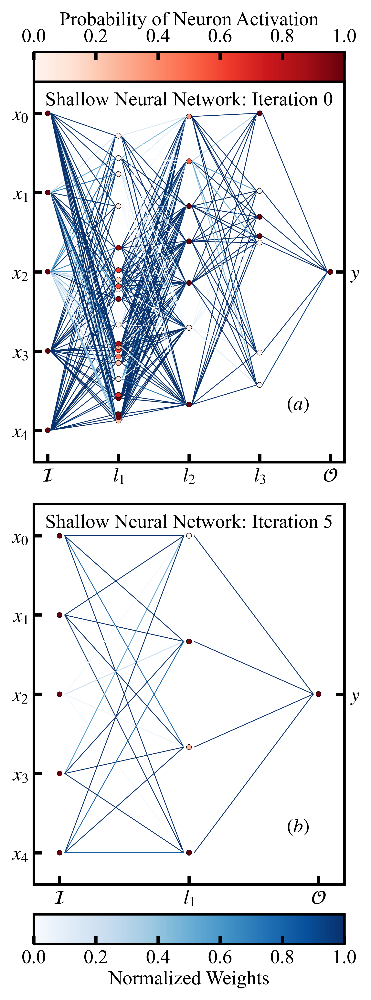

In [66]:
def PlotIterDict(data_dic, iter_nums, n_input_features, fig_size):
        
        params =  {
        'axes.labelsize': 12,
            'axes.linewidth' : 1.5,
            'font.size': 12,
            'font.family': 'Times New Roman',
            'mathtext.fontset': 'stix',
            'legend.fontsize': 12,
            'xtick.labelsize': 12,
            'ytick.labelsize': 12,
            'text.usetex': False, 
            'lines.linewidth': 1,
            'lines.linestyle': ' ',
            'lines.markersize' : 6,
            'lines.markeredgewidth' : 1,
            'xtick.major.size' : 5,
            'xtick.minor.size' : 0,
            'xtick.major.width' : 2,
            'xtick.minor.width' : 0,
            'xtick.direction' : 'in',
            'ytick.major.size' : 5,
            'ytick.minor.size' : 0,
            'ytick.major.width' : 2,
            'ytick.minor.width' : 0,
            'ytick.direction' : 'in',
            'xtick.minor.visible' : True,
            'ytick.minor.visible' : True,
            'savefig.transparent': False,
            'errorbar.capsize': 1.5,
        #     # white space
                'figure.subplot.left': 0.125, 
                'figure.subplot.right': 0.9,
                'figure.subplot.bottom': 0.11,
                'figure.subplot.top': 0.88,
                'figure.subplot.wspace': 0.2,
                'figure.subplot.hspace': 0.11,
            }
        plt.rcParams.update(params)
        plt.rcParams.update({'figure.figsize': fig_size})
       
        fig, axs = plt.subplots(len(iter_nums),1, dpi=600)
        axs = axs.flatten()
        
        features_tex =['$x_{'+str(i)+'}$' for i in range(n_input_features)]
        target_tex = r'$y$'
        # layer_labels = [r'$\mathcal{I}$',r'$l_1$',r'$l_2$',r'$l_3$',r'$\mathcal{O}$']
        # reverse iternums
        label_nums = iter_nums[::-1]

        n_layers = []
        for i in range(len(iter_nums)):
                if iter_nums[i] == 0:
                        n_layers.append([label_nums[i],np.unique(data_dic[f'initial']['nodeXY'][:,0]).shape[0]])
                else:
                        n_layers.append([label_nums[i],np.unique(data_dic[f'iter_{iter_nums[i]}']['nodeXY'][:,0]).shape[0]])

        # alphabetical labels
        axlabels = [r'$(a)$', r'$(b)$', r'$(c)$', r'$(d)$', r'$(e)$', r'$(f)$', r'$(g)$', r'$(h)$', r'$(i)$', r'$(j)$']
        for i, ax in enumerate(axs):
                data_name = f'iter_{iter_nums[i]}'
                if iter_nums[i] == 0:
                        data_name = 'initial'
                data = data_dic[data_name]
                ax = axs[i]

                ALPHA = 1.0
                WIDTH = 0.3
                if label_nums[i] == 0:
                        ALPHA = 1.0
                        WIDTH = 0.5
                else:
                        ALPHA = 1.0
                        WIDTH = 0.5


                for A, B, W in zip(data['iXY'], data['fXY'], data['lineW'].tolist()):
                        plt.plot([A[0]+0.04, (B[0])-0.04], [10*A[1], 10*B[1]],linewidth=WIDTH, alpha=ALPHA,linestyle='-', c=cm.Blues(10*W), marker=" ", markersize=0)
                plt.scatter(data['nodeXY'][:,0],10*data['nodeXY'][:,1],c=data['nodeW'],cmap=cm.Reds,s=10,alpha=1.0, marker="o", edgecolor='k', linewidth=0.2)



                yvals = np.linspace(1, 10*2000, len(features_tex))
                ax.set_yticks(yvals, minor=False)
                ax.set_yticklabels(features_tex)
                ax.set_ylim(-10*200,10*2200)
                axtw = ax.twinx()
                axtw.set_ylim(ax.get_ylim())
                axtw.set_yticks([10*data['nodeXY'][:,1][-1]], minor=False)
                axtw.set_yticklabels([target_tex])

                n_layer = 0
                for j in n_layers:
                        if j[0] == iter_nums[i]:
                                n_layer = j[1]
                                break
                print("Number of layers: ", n_layer)
                layer_labels = [r'$\mathcal{I}$'] + [r'$l_'+str(i+1)+'$' for i in range(n_layer-2)] + [r'$\mathcal{O}$']
                
               
                ax.set_xticks(np.arange(1, len(layer_labels)+1), minor=False)
                ax.set_xticklabels(layer_labels)
                ax.set_xlim(0.8, len(layer_labels)+0.2)
                
                # iteration index for the plot

                title = f'Shallow Neural Network: Iteration {label_nums[i]}'
                ax.text(0.5, 0.95, title, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=12)
                ax.invert_yaxis()
                ax.text(0.85, 0.15, axlabels[i], horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=12)
        fig.subplots_adjust(top=0.92)
        le = axs[0].get_position().get_points()[0,0]
        re = axs[-1].get_position().get_points()[1,0]
        # be = axs[0].get_position().get_points()[0,1]
        # te = axs[0].get_position().get_points()[1,1]
        cbar_ax = fig.add_axes([le, 0.92, re-le, 0.03])

        plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Reds'), cax=cbar_ax, orientation='horizontal')
        plt.cbar.set_label('Probability of Neuron Activation', rotation=0, labelpad=2, loc='center')
        plt.cbar.ax.xaxis.set_ticks_position('top')
        plt.cbar.ax.xaxis.set_label_position('top')
        cbar_ax = fig.add_axes([le, 0.05, re-le, 0.03])
        plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Blues'), cax=cbar_ax, orientation='horizontal')
        plt.cbar.set_label('Normalized Weights', rotation=0, labelpad=2, loc='center')
        plt.cbar.ax.xaxis.set_ticks_position('bottom')
        plt.cbar.ax.xaxis.set_label_position('bottom')
        # plt.show()
        plt.savefig("svg/SNN.eps", format='eps', dpi=600)
        plt.savefig("pdf/SNN.pdf", format='pdf', dpi=600)
        plt.savefig("png/SNN.png", format='png', dpi=600)

iter_nums = [5,0]
fig_size = ps.GetFigSize(246.0,1.0/len(iter_nums))
PlotIterDict(NN_PRUNED_DATA_100, iter_nums, 5, fig_size)


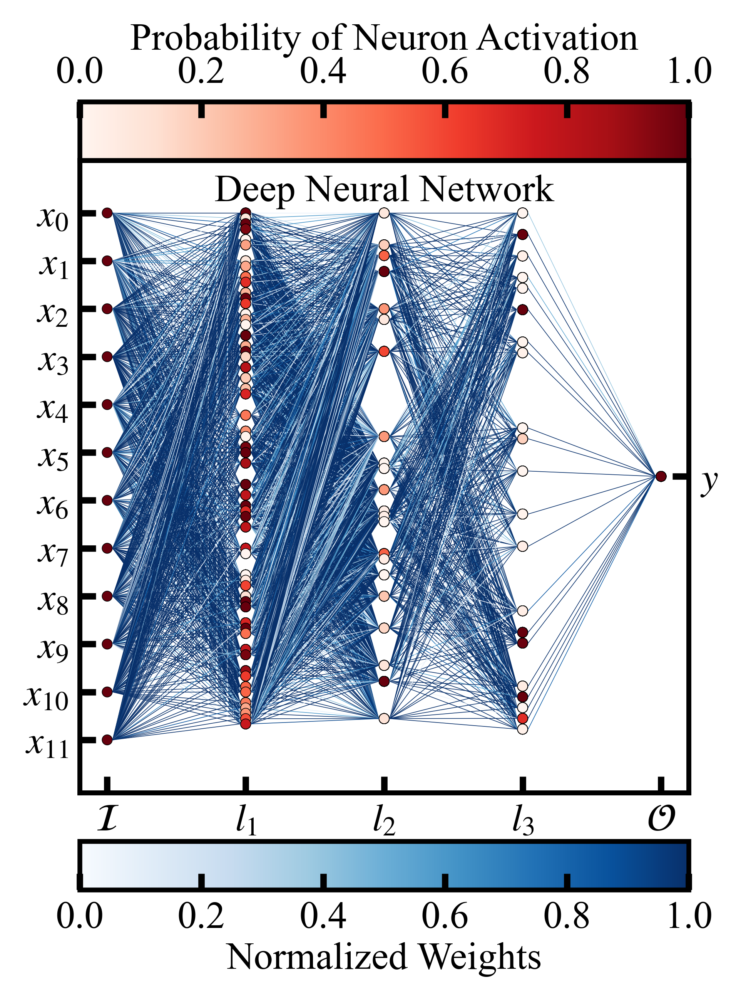

In [71]:
def PlotDict(data, fig_size):
        
        params =  {
        'axes.labelsize': 12,
            'axes.linewidth' : 1.5,
            'font.size': 12,
            'font.family': 'Times New Roman',
            'mathtext.fontset': 'stix',
            'legend.fontsize': 12,
            'xtick.labelsize': 12,
            'ytick.labelsize': 12,
            'text.usetex': False, 
            'lines.linewidth': 1,
            'lines.linestyle': ' ',
            'lines.markersize' : 6,
            'lines.markeredgewidth' : 1,
            'xtick.major.size' : 5,
            'xtick.minor.size' : 0,
            'xtick.major.width' : 2,
            'xtick.minor.width' : 0,
            'xtick.direction' : 'in',
            'ytick.major.size' : 5,
            'ytick.minor.size' : 0,
            'ytick.major.width' : 2,
            'ytick.minor.width' : 0,
            'ytick.direction' : 'in',
            'xtick.minor.visible' : True,
            'ytick.minor.visible' : True,
            'savefig.transparent': False,
            'errorbar.capsize': 1.5,
        #     # white space
                'figure.subplot.left': 0.125, 
                'figure.subplot.right': 0.9,
                'figure.subplot.bottom': 0.11,
                'figure.subplot.top': 0.88,
                'figure.subplot.wspace': 0.2,
                'figure.subplot.hspace': 0.11,
            }
        
        plt.rcParams.update(params)
        plt.rcParams.update({'figure.figsize': fig_size})
       
        fig, axs = plt.subplots(1,1, dpi=600)
        # axs = axss[0]

        n_input_features = len(np.where(data['nodeXY'][:,0] == 1)[0])
        features_tex =['$x_{'+str(i)+'}$' for i in range(n_input_features)]
        target_tex = r'$y$'
        n_layers = np.unique(data['nodeXY'][:,0]).shape[0]
        layer_labels = [r'$\mathcal{I}$'] + [r'$l_'+str(i+1)+'$' for i in range(n_layers-2)] + [r'$\mathcal{O}$']

        ALPHA = 1.0
        WIDTH = 0.2

        for A, B, W in zip(data['iXY'], data['fXY'], data['lineW'].tolist()):
                plt.plot([A[0]+0.04, (B[0])-0.04], [A[1], B[1]],linewidth=WIDTH, alpha=ALPHA,linestyle='-', c=cm.Blues(10*W), marker=" ", markersize=0)
        plt.scatter(data['nodeXY'][:,0],data['nodeXY'][:,1],c=data['nodeW'],cmap=cm.Reds,s=10,alpha=1.0, marker="o", edgecolor='k', linewidth=0.2)

        yvals = np.linspace(1, 10*2000, len(features_tex))
        axs.set_yticks(yvals, minor=False)
        axs.set_yticklabels(features_tex)
        axs.set_ylim(-10*200,10*2200)
        axtw = axs.twinx()
        axtw.set_ylim(axs.get_ylim())
        axtw.set_yticks([data['nodeXY'][:,1][-1]], minor=False)
        axtw.set_yticklabels([target_tex])
        title = 'Deep Neural Network'
        axs.text(0.5, 0.95, title, horizontalalignment='center', verticalalignment='center', transform=axs.transAxes, fontsize=12)
        axs.invert_yaxis()
        axs.set_xticks(np.arange(1, len(layer_labels)+1), minor=False)
        axs.set_xticklabels(layer_labels)
        axs.set_xlim(0.8, len(layer_labels)+0.2)


 
        fig.subplots_adjust(top=0.84, bottom=0.19)
        le = axs.get_position().get_points()[0,0]
        re = axs.get_position().get_points()[1,0]
        cbar_ax = fig.add_axes([le, 0.84, re-le, 0.06])

        plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Reds'), cax=cbar_ax, orientation='horizontal')
        plt.cbar.set_label('Probability of Neuron Activation', rotation=0, labelpad=2, loc='center')
        plt.cbar.ax.xaxis.set_ticks_position('top')
        plt.cbar.ax.xaxis.set_label_position('top')
        cbar_ax = fig.add_axes([le, 0.09, re-le, 0.05])
        plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Blues'), cax=cbar_ax, orientation='horizontal')
        plt.cbar.set_label('Normalized Weights', rotation=0, labelpad=2, loc='center')
        plt.cbar.ax.xaxis.set_ticks_position('bottom')
        plt.cbar.ax.xaxis.set_label_position('bottom')
        # plt.show()
        plt.savefig("svg/DNN.eps", format='eps', dpi=600)
        plt.savefig("pdf/DNN.pdf", format='pdf', dpi=600)
        plt.savefig("png/DNN.png", format='png', dpi=600)


fig_size = ps.GetFigSize(246.0,1.0)
PlotDict(NN_DATA['dnn_no_reg'], fig_size)
 

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_89 (Dense)            (None, 100)               1300      
                                                                 
 dense_90 (Dense)            (None, 100)               10100     
                                                                 
 dense_91 (Dense)            (None, 50)                5050      
                                                                 
 dense_92 (Dense)            (None, 1)                 51        
                                                                 
Total params: 16,501
Trainable params: 16,501
Non-trainable params: 0
_________________________________________________________________
Epoch 47: early stopping
MSE of model:  2.277592182159424
Reduced sum of W^2:  340.2028598487377
[58, 22, 21, 1]


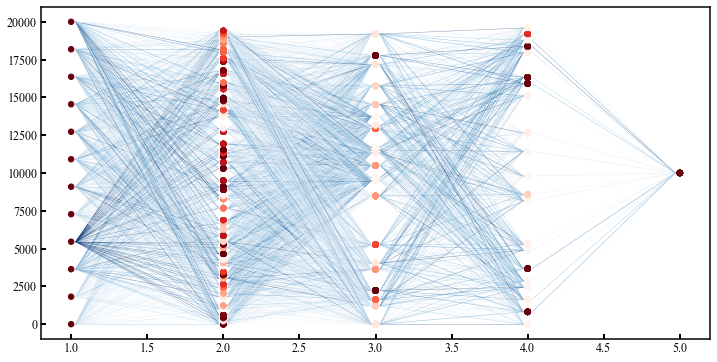

In [53]:
NN_DATA = {}
NN_DATA['dnn_no_reg'] = GetDNNPlot(kernel_reg=False)

In [ ]:
NN_DATA = {}
NN_DATA['dnn_no_reg'] = GetDNNPlot(kernel_reg=False)
# # NN_DATA['dnn_some_reg'] = GetDNNPlot(kernel_reg=True, lam = 0.001)
# NN_DATA['dnn_reg'] = GetDNNPlot(kernel_reg=True, lam = 0.01)

9999.5


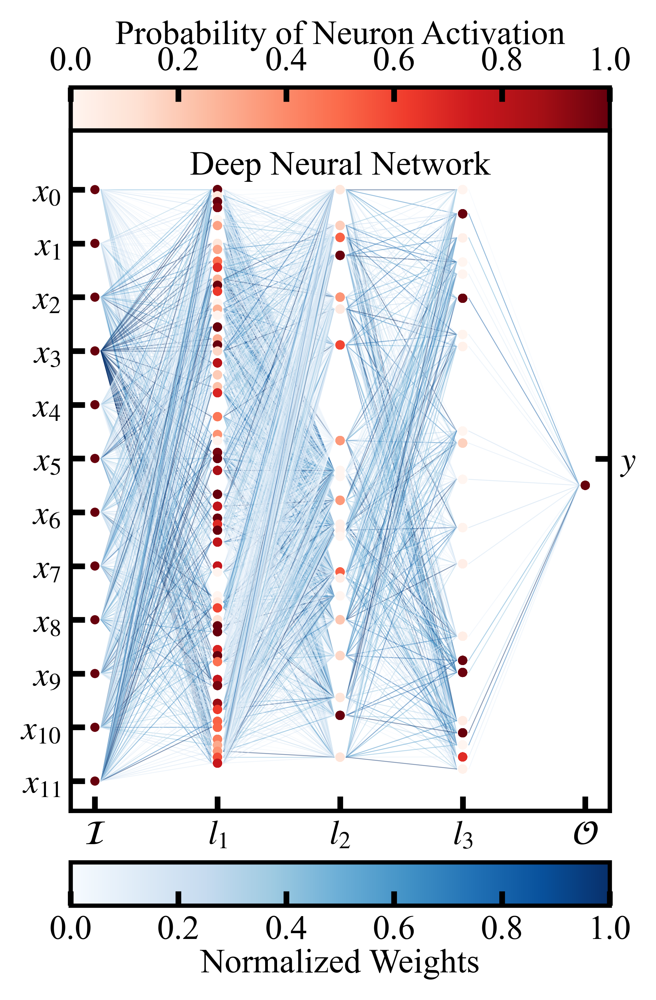

In [54]:
def PlotDict(data, fig_size):
        
        params =  {
        'axes.labelsize': 12,
            'axes.linewidth' : 1.5,
            'font.size': 12,
            'font.family': 'Times New Roman',
            'mathtext.fontset': 'stix',
            'legend.fontsize': 12,
            'xtick.labelsize': 12,
            'ytick.labelsize': 12,
            'text.usetex': False, 
            'lines.linewidth': 1,
            'lines.linestyle': ' ',
            'lines.markersize' : 6,
            'lines.markeredgewidth' : 1,
            'xtick.major.size' : 5,
            'xtick.minor.size' : 0,
            'xtick.major.width' : 2,
            'xtick.minor.width' : 0,
            'xtick.direction' : 'in',
            'ytick.major.size' : 5,
            'ytick.minor.size' : 0,
            'ytick.major.width' : 2,
            'ytick.minor.width' : 0,
            'ytick.direction' : 'in',
            'xtick.minor.visible' : True,
            'ytick.minor.visible' : True,
            'savefig.transparent': True,
            'errorbar.capsize': 1.5,
            }
        plt.rcParams.update(params)
        plt.rcParams.update({'figure.figsize': fig_size})
        # n_nets = len(data_dict)
        # fig, axs = plt.subplots(1, len(data_dict), constrained_layout=True)
       
        fig = plt.figure(dpi=600)
        ax1 = plt.subplot(111)
        
        features_tex =  [r'$p_{\mathrm{T,jet}}^{raw}$',  r'$N_{\mathrm{track}}$', r'$A_{\mathrm{jet}}$', r'$\lambda_{\alpha=1}$', r'$p_{\mathrm{T,track}}^{0}$',
                        r'$p_{\mathrm{T,track}}^{1}$', r'$p_{\mathrm{T,track}}^{2}$', r'$p_{\mathrm{T,track}}^{3}$', r'$p_{\mathrm{T,track}}^{4}$',
                        r'$p_{\mathrm{T,track}}^{5}$', r'$p_{\mathrm{T,track}}^{6}$', r'$p_{\mathrm{T,track}}^{7}$']
        features_tex =['$x_{'+str(i)+'}$' for i in range(len(features_tex))]
        
        target_tex = r'$p_{\mathrm{T,jet}}^{truth}$'
        target_tex = r'$y$'
        layer_labels = [r'$\mathcal{I}$',r'$l_1$',r'$l_2$',r'$l_3$',r'$\mathcal{O}$']
        
       
        for A, B, W in zip(data['iXY'], data['fXY'], data['lineW'].tolist()):
                plt.plot([A[0]+0.05, B[0]-0.05], [A[1], B[1]],linewidth=0.3, alpha=0.5,linestyle='-', c=cm.Blues(W), marker=" ", markersize=0)
        plt.scatter(data['nodeXY'][:,0],data['nodeXY'][:,1],c=data['nodeW'],cmap=cm.Reds,s=5,alpha=1.0)
        # ax1.scatter(data['nodeXY'][:,0],data['nodeXY'][:,1],c="r",s=2,alpha=1.0)
        
        # for i in range(len(features_tex)):
                # ax1.text(data['nodeXY'][0,i]-0.5,data['nodeXY'][1,i],features_tex[i],fontsize=8)
                
        yvals = np.linspace(1, 10*2000, len(features_tex))
        ax1.set_yticks(yvals, minor=False)
        ax1.set_yticklabels(features_tex)
        ax1.set_ylim(-10*200,10*2100)
        ax1tw = ax1.twinx()
        ax1tw.set_ylim(ax1.get_ylim())
        ax1tw.set_yticks([data['nodeXY'][:,1][-1]-100], minor=False)
        print(data['nodeXY'][:,1][-1])
        ax1tw.set_yticklabels([target_tex])
        ax1.set_xticks(np.arange(1, len(layer_labels)+1), minor=False)
        ax1.set_xticklabels(layer_labels)
        # ax1.text(0.2, 1.3, r'$\lambda =$'+f'{data["lam"]:.2f}'+', '+r'$\mathrm{MSE}$ = '+f'{data["mse"]:.2f}'+', '+r'$N_{\mathrm{nodes}}$ =' +f'{data["trainable"]}',fontsize=12,va='top', ha='left')
       
        ax1.invert_yaxis()
        # ax1.set_xlim(ax1.get_xlim()[0], len(layer_labels)+0.8)
        # ax1.text(0.2, 1.3, r'$\lambda =$'+f'{data["lam"]:.2f}'+', '+r'$\mathrm{MSE}$ = '+f'{data["mse"]:.2f}'+', '+r'$N_{\mathrm{nodes}}$ =' +f'{data["trainable"]}',fontsize=12,va='top', ha='left')
        # ax1.text(0.05, 0.97, r'$\lambda =$'+f'{data["lam"]:.2f},', transform=ax1.transAxes, fontsize=10, va='top', ha='left')
        # ax1.text(0.29, 0.97, r'$\mathrm{MSE}$ = '+f'{data["mse"]:.2f},', transform=ax1.transAxes, fontsize=10, va='top', ha='left')
        # ax1.text(0.65, 0.97, r'$N_{\mathrm{nodes}}$ =' +f'{data["trainable"]}' , transform=ax1.transAxes, fontsize=10, va='top', ha='left')
        
        #add colorbar along the top of all axes
        fig.subplots_adjust(top=0.9)

        # left edge of axes in figure coordinates
        le = ax1.get_position().get_points()[0,0]
        # right edge of axes in figure coordinates
        re = ax1.get_position().get_points()[1,0]
        # bottom edge of axes in figure coordinates
        be = ax1.get_position().get_points()[0,1]
        # top edge of axes in figure coordinates
        te = ax1.get_position().get_points()[1,1]

        #top of the figure


        #add colorbar along the top of all axes
        cbar_ax = fig.add_axes([le, 0.9, re-le, 0.05])
        # cbar_ax = fig.add_axes([0.0, 0.95, 0.7, 0.02])
        plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Reds'), cax=cbar_ax, orientation='horizontal')
        plt.cbar.set_label('Probability of Neuron Activation', rotation=0, labelpad=1, loc='center')
        plt.cbar.ax.xaxis.set_ticks_position('top')
        plt.cbar.ax.xaxis.set_label_position('top')
        
        #add colorbar along the bottom of all axes
        cbar_ax = fig.add_axes([le, 0.0, re-le, 0.05])

        plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Blues'), cax=cbar_ax, orientation='horizontal')
        plt.cbar.set_label('Normalized Weights', rotation=0, labelpad=1, loc='center')
        plt.cbar.ax.xaxis.set_ticks_position('bottom')
        plt.cbar.ax.xaxis.set_label_position('bottom')

        ax1.text(0.5, 0.97, r'Deep Neural Network', transform=ax1.transAxes, fontsize=12, va='top', ha='center')
        # plt.show()
        # ax1.set_title(r'$\lambda =$'+f'{data["lam"]:.2f}'+', '+r'$\mathrm{MSE}$ = '+f'{data["mse"]:.2f}'+', '+r'$N_{nodes}$ =' +f'{data["trainable"]}')
        # plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Reds'), ax=ax1, location='top',pad=0.00,anchor=(0.5,1.0))
        # plt.cbar.set_label('Probability of Neuron Activation', rotation=0, labelpad=2, loc='center')
        # plt.cbar = plt.colorbar(cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=1), cmap='Blues'), ax=ax1, location='bottom',pad=0.00,anchor=(0.5,-0.01))
        # plt.cbar.set_label('Normalized Weights', rotation=0, labelpad=2, loc='center')
        
        plt.show()
        # plt.savefig("svg/DNN.svg", format='svg', dpi=600)
        # plt.savefig("pdf/DNN.pdf", format='pdf', dpi=600)
fig_size = ps.GetFigSize(246.0,1.0)
PlotDict(NN_DATA['dnn_no_reg'], fig_size)
 

In [ ]:
fig = plt.imread('svg/DNN.svg')
plt.figure(figsize=(10,10))
plt.imshow(fig)
plt.show( )

In [ ]:
import paperstyle as ps
import matplotlib.pyplot as plt

fig_size = ps.GetFigSize(510.0, 1.7)
plt.rcParams.update(ps.style)
plt.rcParams.update({'figure.figsize': fig_size})
params = {'axes.labelsize': 18,
            'axes.linewidth' : 1.5,
            'font.size': 18,
            'font.family': 'Times New Roman',
            'mathtext.fontset': 'stix',
            'legend.fontsize': 20,
            'xtick.labelsize': 18,
            'ytick.labelsize': 20,
            'text.usetex': False,
            'lines.linewidth': 1,
            'lines.linestyle': ' ',
            'lines.markersize' : 6,
            'lines.markeredgewidth' : 1,
            'xtick.major.size' : 5,
            'xtick.minor.size' : 3,
            'xtick.major.width' : 2,
            'xtick.minor.width' : 1,
            'xtick.direction' : 'in',
            'ytick.major.size' : 5,
            'ytick.minor.size' : 3,
            'ytick.major.width' : 2,
            'ytick.minor.width' : 1,
            'ytick.direction' : 'in',
            'xtick.minor.visible' : True,
            'ytick.minor.visible' : True,
            'figure.figsize': (8,6),
            'savefig.transparent': True,
            'errorbar.capsize': 1.5,
            }
plt.rcParams.update(params)

fig = plt.figure(constrained_layout=True,dpi=300)
dnn_features = ["jet_pt_raw","jet_nparts","jet_area","jet_angularity","jet_track_pt_0",
                            "jet_track_pt_1","jet_track_pt_2","jet_track_pt_3","jet_track_pt_4",
                            "jet_track_pt_5","jet_track_pt_6","jet_track_pt_7"]
dnn_features_tex =  [r'$p_{\mathrm{T,jet}}^{raw}$',  r'$N_{\mathrm{track}}$', r'$A_{\mathrm{jet}}$', r'$\lambda_{\alpha=1}$', r'$p_{\mathrm{T,track}}^{0}$',
                            r'$p_{\mathrm{T,track}}^{1}$', r'$p_{\mathrm{T,track}}^{2}$', r'$p_{\mathrm{T,track}}^{3}$', r'$p_{\mathrm{T,track}}^{4}$',
                            r'$p_{\mathrm{T,track}}^{5}$', r'$p_{\mathrm{T,track}}^{6}$', r'$p_{\mathrm{T,track}}^{7}$']

target='jet_pt_truth'
target_tex = r'$p_{\mathrm{T,jet}}^{truth}$'
n_nodes_initial = [len(dnn_features), 100,100,50,1]
ymin = 1
ymax = 2000
layers = len(n_nodes_initial)
ax = fig.add_subplot(111)
for layer, nodes in enumerate(n_nodes_initial):
    print(nodes,layer)
    if nodes == 0:
        continue
    xvalues = []
    for node in range(nodes):
        xvalues.append(layer+1)
    xvalues = np.array(xvalues)
    if layer != layers-1:
        # yvalues = np.linspace(ymin,ymax,nodes)
        if layer == 0:
            yvalues = np.linspace(ymin+300,ymax-300,nodes)
        else:
            yvalues = np.linspace(ymin,ymax,nodes)
    else:
        yvalues = np.array([(ymax-ymin)/2.0])
        
    if layer == 0:
        ax.scatter(xvalues,yvalues,marker='o',s=5,color='k')
    elif layer == layers-1:
        ax.scatter(xvalues,yvalues,marker='o',s=5,color='r',label=r'ReLU Activation')
    else:
        ax.scatter(xvalues,yvalues,marker='o',s=5,color='r')
    
    
    if layer != 0:
        if layer == 1:
            yvalues_last = np.linspace(ymin+300,ymax-300,n_nodes_initial[layer-1])
        else:
            yvalues_last = np.linspace(ymin,ymax,n_nodes_initial[layer-1])
        for node in range(nodes):
            xi = layer+1-0.03
            xf = layer+0.03
            yi = yvalues[node]
            for lastnodes in range(n_nodes_initial[layer-1]):
                yf = yvalues_last[lastnodes]
                ax.plot([xi,xf],[yi,yf],color='b',alpha=0.9, linestyle='-', linewidth=0.1)
               
        
        # ax.plot([xi,xf],[yi,yf],color='r',alpha=0.9, linestyle='-', linewidth=0.1,label=r'$\sigma$ = ReLU')
                    


ax.legend(loc='upper right',ncol=1,handletextpad=0.1,handlelength=1.0,markerscale=2.0,fontsize=12,frameon=False)
ax.set_xticks(np.arange(1,layers+1), minor=False)
dnn_layer_labels = [r'$\mathcal{I}$',r'$l_1(100)$ ',r'$l_2(100)$',r'$l_3(50)$',r'$\mathcal{O}$']
# dnn_layer_labels2=["",r"$n$ = $100$",r"$n$ = $100$",r"$n$ = $50$",""]

ax.set_xticklabels(dnn_layer_labels, minor=False)

y_values_initial = np.linspace(ymin+300,ymax-300,n_nodes_initial[0])
y_values_final = np.array([(ymax-ymin)/2.0])
ax.set_yticks(y_values_initial, minor=False)
ax.set_yticklabels(dnn_features_tex,minor=False)
ax.set_xlim(0.8,layers+0.2)
ax.invert_yaxis()
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())
ax2.set_yticks(y_values_final, minor=False)
ax2.set_xlim(0.8,layers+0.2)
# ax2.xaxis.tick_top()
# ax2.set_xticks(np.arange(1,layers+1), minor=False)
# ax2.set_xticklabels(dnn_layer_labels2, minor=False)
# ax2.xaxis.set_label_position('top')
ax2.tick_params(axis='y', which='both', length=0)
ax.tick_params(axis='y', which='both', length=0)
ax.tick_params(axis='x', which='both', length=0)
ax2.tick_params(axis='x', which='both', length=0)
ax2.set_yticklabels([target_tex], minor=False)

ax.set_frame_on(False)
ax2.set_frame_on(False)

# plt.axis('off')
plt.show()
            